In [5]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

IMG_SIZE = 256
BATCH_SIZE = 64
EPOCHS = 20
DATA_DIR = 'Aerial_Landscapes'

In [7]:
from torchvision import transforms
from torch.utils.data import Dataset
from PIL import Image
from torch.utils.data import Subset
from torchvision import transforms
from torchvision.transforms import Resize, ToTensor, AutoAugment, AutoAugmentPolicy, GaussianBlur, ColorJitter

class AddGaussianNoise(object):
    def __init__(self, mean=0., std=0.1):
        self.mean = mean
        self.std = std

    def __call__(self, tensor):
        return tensor + torch.randn_like(tensor) * self.std + self.mean

    def __repr__(self):
        return f'{self.__class__.__name__}(mean={self.mean}, std={self.std})'

train_transform = transforms.Compose([
    Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomApply([
        GaussianBlur(kernel_size=(3, 3), sigma=(0.1, 2.0))
    ], p=0.3),
    transforms.RandomApply([
        ColorJitter(brightness=0.2, contrast=0.2)
    ], p=0.3),
    AutoAugment(policy=AutoAugmentPolicy.IMAGENET),
    ToTensor(),
    transforms.RandomApply([
        AddGaussianNoise(std=0.05)
    ], p=0.3)
])


val_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor()
])

        
class CustomDataset(Dataset):
    def __init__(self, subset, transform=None):
        self.subset = subset
        self.transform = transform

    def __len__(self):
        return len(self.subset)

    def __getitem__(self, idx):
        img_path, label = self.subset.dataset.samples[self.subset.indices[idx]]
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image, label

In [9]:
# 加载完整 ImageFolder 数据（不带 transform）
base_dataset = datasets.ImageFolder(DATA_DIR)

# 手动划分索引
total_size = len(base_dataset)
val_size = int(0.2 * total_size)
train_size = total_size - val_size

train_indices, val_indices = torch.utils.data.random_split(
    range(total_size), [train_size, val_size])

# 包装成 Subset
train_subset = Subset(base_dataset, train_indices)
val_subset = Subset(base_dataset, val_indices)

# 使用 CustomDataset 分别设置 transform
train_dataset = CustomDataset(train_subset, transform=train_transform)
val_dataset = CustomDataset(val_subset, transform=val_transform)

# 构建 DataLoader
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)

# Handle the imbalance of categories

In [12]:
from collections import Counter

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
labels = [train_dataset.subset.dataset.samples[i][1] for i in train_dataset.subset.indices]

class_counts = Counter(labels)
total = sum(class_counts.values())
class_weights = {cls: total / count for cls, count in class_counts.items()}
weights_tensor = torch.tensor([class_weights[i] for i in range(len(class_counts))], dtype=torch.float).to(device)

class_to_idx = train_dataset.subset.dataset.class_to_idx
idx_to_class = {v: k for k, v in class_to_idx.items()}

for idx, weight in enumerate(weights_tensor):
    print(f"Class {idx:2d} [{idx_to_class[idx]:>15}]: weight = {weight.item():.4f}")

Class  0 [    Agriculture]: weight = 15.0943
Class  1 [        Airport]: weight = 14.7465
Class  2 [          Beach]: weight = 14.7465
Class  3 [           City]: weight = 15.2866
Class  4 [         Desert]: weight = 14.5897
Class  5 [         Forest]: weight = 15.0470
Class  6 [      Grassland]: weight = 15.1181
Class  7 [        Highway]: weight = 14.7014
Class  8 [           Lake]: weight = 15.1420
Class  9 [       Mountain]: weight = 15.4341
Class 10 [        Parking]: weight = 14.9766
Class 11 [           Port]: weight = 15.2623
Class 12 [        Railway]: weight = 14.8377
Class 13 [    Residential]: weight = 14.8837
Class 14 [          River]: weight = 15.1899


In [14]:
class SELayer(nn.Module):
    def __init__(self, channel, reduction=16):
        super(SELayer, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
            nn.Linear(channel, channel // reduction, bias=False),
            nn.ReLU(inplace=True),
            nn.Linear(channel // reduction, channel, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        y = self.avg_pool(x).view(b, c)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y.expand_as(x)

In [16]:
class DeepCNN(nn.Module):
    def __init__(self, num_classes):
        super(DeepCNN, self).__init__()
        self.features = nn.Sequential(
            # Conv Block 1
            nn.Conv2d(3, 32, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            SELayer(32),

            # Conv Block 2
            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            SELayer(64),

            # Conv Block 3
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            SELayer(128),

            # Conv Block 4
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            SELayer(256)
        )

        self.global_pool = nn.AdaptiveAvgPool2d(1)

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(256, 128),
            nn.ReLU(),
            nn.BatchNorm1d(128),

            nn.Linear(128, 64),
            nn.ReLU(),
            nn.BatchNorm1d(64),

            nn.Linear(64, 32),
            nn.ReLU(),
            nn.BatchNorm1d(32),
            nn.Dropout(0.3),

            nn.Linear(32, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.global_pool(x)
        x = self.classifier(x)
        return x

In [18]:
from torchsummary import summary

model = DeepCNN(num_classes=15).to("cuda")
summary(model, input_size=(3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 128, 128]             896
       BatchNorm2d-2         [-1, 32, 128, 128]              64
              ReLU-3         [-1, 32, 128, 128]               0
 AdaptiveAvgPool2d-4             [-1, 32, 1, 1]               0
            Linear-5                    [-1, 2]              64
              ReLU-6                    [-1, 2]               0
            Linear-7                   [-1, 32]              64
           Sigmoid-8                   [-1, 32]               0
           SELayer-9         [-1, 32, 128, 128]               0
           Conv2d-10           [-1, 64, 64, 64]          18,496
      BatchNorm2d-11           [-1, 64, 64, 64]             128
             ReLU-12           [-1, 64, 64, 64]               0
AdaptiveAvgPool2d-13             [-1, 64, 1, 1]               0
           Linear-14                   

In [162]:
import torch
import torch.nn as nn
import numpy as np
from torchvision.transforms import RandAugment
import random

# === MixUp 函数 ===
def mixup_data(x, y, alpha=0.4):
    if alpha > 0:
        lam = np.random.beta(alpha, alpha)
    else:
        lam = 1.0
    batch_size = x.size(0)
    index = torch.randperm(batch_size).to(x.device)

    mixed_x = lam * x + (1 - lam) * x[index, :]
    y_a, y_b = y, y[index]
    return mixed_x, y_a, y_b, lam

# === Cutout函数 ===
def cutout_batch(images, cutout_size=32):
    """在一个 batch 的图像中随机遮挡区域（全0）"""
    for i in range(images.size(0)):
        h, w = images.size(2), images.size(3)
        y = random.randint(0, h - cutout_size)
        x = random.randint(0, w - cutout_size)
        images[i, :, y:y + cutout_size, x:x + cutout_size] = 0
    return images

In [184]:
import torch
import torch.nn as nn
import numpy as np
import random
from tqdm import tqdm


def mixup_data(x, y, alpha=0.4):
    if alpha > 0:
        lam = np.random.beta(alpha, alpha)
    else:
        lam = 1.0
    batch_size = x.size(0)
    index = torch.randperm(batch_size).to(x.device)
    mixed_x = lam * x + (1 - lam) * x[index, :]
    y_a, y_b = y, y[index]
    return mixed_x, y_a, y_b, lam


def cutout_batch(images, cutout_size=32):
    for i in range(images.size(0)):
        h, w = images.size(2), images.size(3)
        y = random.randint(0, h - cutout_size)
        x = random.randint(0, w - cutout_size)
        images[i, :, y:y + cutout_size, x:x + cutout_size] = 0
    return images


def train_model(model, train_loader, val_loader, optimizer, criterion, device, num_epochs=20, patience=5):
    model.to(device)
    best_acc = 0.0
    best_model_state = None
    wait = 0

    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5,
                                                           patience=2, min_lr=1e-6)
    current_lr = scheduler.optimizer.param_groups[0]['lr']
    print(f"Current rate of learning: {current_lr:.6f}")


    history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}

    for epoch in range(num_epochs):
        model.train()
        total_loss, correct, total = 0, 0, 0
        train_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Train]", ncols=100)

        for images, labels in train_bar:
            images, labels = images.to(device), labels.to(device)
            images = cutout_batch(images, cutout_size=32)
            mixed_images, targets_a, targets_b, lam = mixup_data(images, labels, alpha=0.4)

            outputs = model(mixed_images)
            loss = lam * criterion(outputs, targets_a) + (1 - lam) * criterion(outputs, targets_b)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += (lam * predicted.eq(targets_a).sum().item() +
                        (1 - lam) * predicted.eq(targets_b).sum().item())

        train_loss = total_loss / len(train_loader)
        train_acc = 100. * correct / total
        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)

        model.eval()
        val_loss, val_correct, val_total = 0.0, 0, 0
        with torch.no_grad():
            val_bar = tqdm(val_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Val]  ", ncols=100)
            for images, labels in val_bar:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item()
                _, predicted = outputs.max(1)
                val_total += labels.size(0)
                val_correct += predicted.eq(labels).sum().item()

        val_loss /= len(val_loader)
        val_acc = 100. * val_correct / val_total
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)

        print(f"[Epoch {epoch+1}] Train Loss: {train_loss:.4f} | Acc: {train_acc:.4f}% | "
              f"Val Loss: {val_loss:.4f} | Acc: {val_acc:.4f}%")

        scheduler.step(val_acc)

        if val_acc > best_acc:
            best_acc = val_acc
            best_model_state = model.state_dict()
            wait = 0
        else:
            wait += 1
            if wait >= patience:
                print(f"Early stopping triggered at epoch {epoch+1}.")
                break

    if best_model_state:
        model.load_state_dict(best_model_state)
        torch.save(model.state_dict(), "CNN_model.pth")
        print(f"Best model restored with validation accuracy: {best_acc:.4f}%")

    with open("CNN_history.json", "w") as f:
        json.dump(history, f)
    print("Training history saved to CNN_history.json")

    return model, history

In [186]:
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Current device:", device)

Current device: cuda


In [188]:
criterion = nn.CrossEntropyLoss(weight=weights_tensor)
optimizer = torch.optim.AdamW(model.parameters(), lr=5e-4)

model, history = train_model(model, train_loader, val_loader, optimizer, criterion, device='cuda', num_epochs=30, patience=5)

Current rate of learning: 0.000500


Epoch 1/30 [Val]  : 100%|███████████████████████████████████████████| 38/38 [00:06<00:00,  5.99it/s]


[Epoch 1] Train Loss: 1.3381 | Acc: 65.1012% | Val Loss: 0.6444 | Acc: 82.2500%


Epoch 2/30 [Val]  : 100%|███████████████████████████████████████████| 38/38 [00:06<00:00,  6.06it/s]


[Epoch 2] Train Loss: 1.3219 | Acc: 65.9853% | Val Loss: 0.6045 | Acc: 82.5000%


Epoch 3/30 [Val]  : 100%|███████████████████████████████████████████| 38/38 [00:05<00:00,  6.36it/s]


[Epoch 3] Train Loss: 1.2969 | Acc: 66.2724% | Val Loss: 0.5727 | Acc: 84.4583%


Epoch 4/30 [Val]  : 100%|███████████████████████████████████████████| 38/38 [00:05<00:00,  6.46it/s]


[Epoch 4] Train Loss: 1.3173 | Acc: 65.8739% | Val Loss: 0.5575 | Acc: 85.2917%


Epoch 5/30 [Val]  : 100%|███████████████████████████████████████████| 38/38 [00:06<00:00,  6.10it/s]


[Epoch 5] Train Loss: 1.3272 | Acc: 65.4035% | Val Loss: 0.6285 | Acc: 83.0417%


Epoch 6/30 [Val]  : 100%|███████████████████████████████████████████| 38/38 [00:06<00:00,  6.19it/s]


[Epoch 6] Train Loss: 1.2319 | Acc: 67.9201% | Val Loss: 0.5429 | Acc: 85.9167%


Epoch 7/30 [Val]  : 100%|███████████████████████████████████████████| 38/38 [00:06<00:00,  5.93it/s]


[Epoch 7] Train Loss: 1.3094 | Acc: 66.2604% | Val Loss: 0.6301 | Acc: 82.6667%


Epoch 8/30 [Val]  : 100%|███████████████████████████████████████████| 38/38 [00:06<00:00,  6.00it/s]


[Epoch 8] Train Loss: 1.3808 | Acc: 64.2535% | Val Loss: 0.6021 | Acc: 84.7083%


Epoch 9/30 [Val]  : 100%|███████████████████████████████████████████| 38/38 [00:06<00:00,  5.97it/s]


[Epoch 9] Train Loss: 1.1832 | Acc: 69.8463% | Val Loss: 0.4946 | Acc: 86.3750%


Epoch 10/30 [Val]  : 100%|██████████████████████████████████████████| 38/38 [00:06<00:00,  6.09it/s]


[Epoch 10] Train Loss: 1.3139 | Acc: 66.3983% | Val Loss: 0.5304 | Acc: 86.9583%


Epoch 11/30 [Val]  : 100%|██████████████████████████████████████████| 38/38 [00:05<00:00,  6.73it/s]


[Epoch 11] Train Loss: 1.2564 | Acc: 67.6039% | Val Loss: 0.5516 | Acc: 85.1250%


Epoch 12/30 [Val]  : 100%|██████████████████████████████████████████| 38/38 [00:06<00:00,  5.99it/s]


[Epoch 12] Train Loss: 1.2352 | Acc: 68.6402% | Val Loss: 0.5207 | Acc: 85.7917%


Epoch 13/30 [Val]  : 100%|██████████████████████████████████████████| 38/38 [00:06<00:00,  6.08it/s]


[Epoch 13] Train Loss: 1.2716 | Acc: 67.4828% | Val Loss: 0.4844 | Acc: 88.1667%


Epoch 14/30 [Val]  : 100%|██████████████████████████████████████████| 38/38 [00:06<00:00,  5.87it/s]


[Epoch 14] Train Loss: 1.2541 | Acc: 68.1897% | Val Loss: 0.6179 | Acc: 82.8333%


Epoch 15/30 [Val]  : 100%|██████████████████████████████████████████| 38/38 [00:06<00:00,  6.19it/s]


[Epoch 15] Train Loss: 1.2892 | Acc: 66.9763% | Val Loss: 0.5649 | Acc: 84.7500%


Epoch 16/30 [Val]  : 100%|██████████████████████████████████████████| 38/38 [00:06<00:00,  5.94it/s]


[Epoch 16] Train Loss: 1.3188 | Acc: 65.9107% | Val Loss: 0.5505 | Acc: 85.3333%


Epoch 17/30 [Val]  : 100%|██████████████████████████████████████████| 38/38 [00:06<00:00,  5.74it/s]


[Epoch 17] Train Loss: 1.2450 | Acc: 68.9981% | Val Loss: 0.4140 | Acc: 90.5000%


Epoch 18/30 [Val]  : 100%|██████████████████████████████████████████| 38/38 [00:06<00:00,  6.02it/s]


[Epoch 18] Train Loss: 1.1989 | Acc: 70.6052% | Val Loss: 0.4437 | Acc: 89.0417%


Epoch 19/30 [Val]  : 100%|██████████████████████████████████████████| 38/38 [00:06<00:00,  6.13it/s]


[Epoch 19] Train Loss: 1.1492 | Acc: 71.7951% | Val Loss: 0.4202 | Acc: 89.3333%


Epoch 20/30 [Val]  : 100%|██████████████████████████████████████████| 38/38 [00:06<00:00,  6.16it/s]


[Epoch 20] Train Loss: 1.2048 | Acc: 70.5983% | Val Loss: 0.4585 | Acc: 88.9167%


Epoch 21/30 [Val]  : 100%|██████████████████████████████████████████| 38/38 [00:06<00:00,  6.14it/s]


[Epoch 21] Train Loss: 1.1361 | Acc: 72.4102% | Val Loss: 0.3938 | Acc: 90.9583%


Epoch 22/30 [Val]  : 100%|██████████████████████████████████████████| 38/38 [00:06<00:00,  5.98it/s]


[Epoch 22] Train Loss: 1.1507 | Acc: 71.9549% | Val Loss: 0.4006 | Acc: 90.7500%


Epoch 23/30 [Val]  : 100%|██████████████████████████████████████████| 38/38 [00:06<00:00,  5.92it/s]


[Epoch 23] Train Loss: 1.0950 | Acc: 73.6542% | Val Loss: 0.3991 | Acc: 91.0417%


Epoch 24/30 [Val]  : 100%|██████████████████████████████████████████| 38/38 [00:06<00:00,  6.10it/s]


[Epoch 24] Train Loss: 1.1618 | Acc: 72.2965% | Val Loss: 0.3952 | Acc: 90.2917%


Epoch 25/30 [Val]  : 100%|██████████████████████████████████████████| 38/38 [00:06<00:00,  6.01it/s]


[Epoch 25] Train Loss: 1.1255 | Acc: 73.0629% | Val Loss: 0.3954 | Acc: 90.5000%


Epoch 26/30 [Val]  : 100%|██████████████████████████████████████████| 38/38 [00:06<00:00,  5.90it/s]


[Epoch 26] Train Loss: 1.2379 | Acc: 69.4530% | Val Loss: 0.4010 | Acc: 90.6250%


Epoch 27/30 [Val]  : 100%|██████████████████████████████████████████| 38/38 [00:06<00:00,  6.32it/s]


[Epoch 27] Train Loss: 1.1581 | Acc: 71.1819% | Val Loss: 0.3932 | Acc: 91.2500%


Epoch 28/30 [Val]  : 100%|██████████████████████████████████████████| 38/38 [00:06<00:00,  6.21it/s]


[Epoch 28] Train Loss: 1.1431 | Acc: 72.4371% | Val Loss: 0.3599 | Acc: 92.0000%


Epoch 29/30 [Val]  : 100%|██████████████████████████████████████████| 38/38 [00:06<00:00,  6.12it/s]


[Epoch 29] Train Loss: 1.0928 | Acc: 74.1220% | Val Loss: 0.3712 | Acc: 91.6667%


Epoch 30/30 [Val]  : 100%|██████████████████████████████████████████| 38/38 [00:06<00:00,  6.05it/s]

[Epoch 30] Train Loss: 1.1788 | Acc: 71.4664% | Val Loss: 0.3925 | Acc: 91.1667%
Best model restored with validation accuracy: 92.0000%
Training history saved to CNN_history.json


In [190]:
import json

with open("CNN_history.json", "r") as f:
    history = json.load(f)

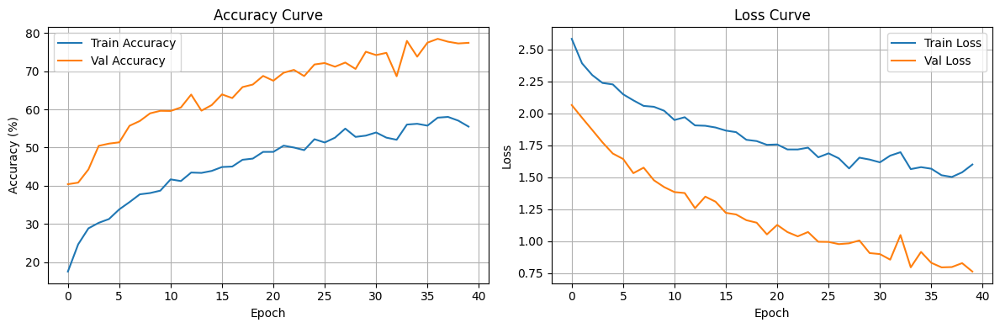

In [58]:
import json
import matplotlib.pyplot as plt

# === 加载 history 文件 ===
with open("CNN_history_1.json", "r") as f:
    history = json.load(f)

# === 可视化训练历史 ===
plt.figure(figsize=(12, 4))

# 准确率曲线
plt.subplot(1, 2, 1)
plt.plot(history['train_acc'], label='Train Accuracy')
plt.plot(history['val_acc'], label='Val Accuracy')
plt.title('Accuracy Curve')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.legend()
plt.grid(True)

# 损失曲线
plt.subplot(1, 2, 2)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Val Loss')
plt.title('Loss Curve')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

# 保存图像
plt.tight_layout()
plt.savefig("training_history.png", dpi=150)

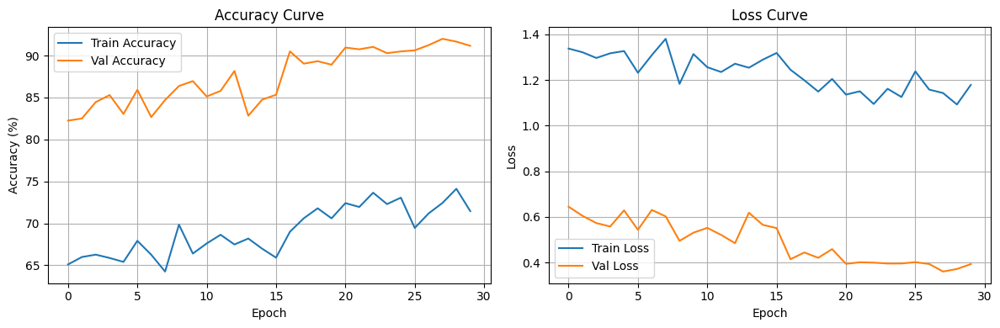

In [192]:
import json
import matplotlib.pyplot as plt

with open("CNN_history.json", "r") as f:
    history = json.load(f)

plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history['train_acc'], label='Train Accuracy')
plt.plot(history['val_acc'], label='Val Accuracy')
plt.title('Accuracy Curve')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Val Loss')
plt.title('Loss Curve')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()

In [194]:
model.load_state_dict(torch.load("CNN_model.pth"))

<All keys matched successfully>

In [196]:
from sklearn.metrics import classification_report

all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in val_loader:
        images = images.to(device)
        outputs = model(images)
        preds = outputs.argmax(dim=1).cpu().numpy()
        all_preds.extend(preds)
        all_labels.extend(labels.numpy())

# 如果你有 class_to_idx，可自动生成标签名
class_to_idx = train_dataset.subset.dataset.class_to_idx
class_labels = [k for k, v in sorted(class_to_idx.items(), key=lambda x: x[1])]

print(classification_report(all_labels, all_preds, target_names=class_labels, digits=4))

              precision    recall  f1-score   support

 Agriculture     0.9317    0.8876    0.9091       169
     Airport     0.8405    0.8839    0.8616       155
       Beach     0.9353    0.9848    0.9594       132
        City     0.9434    0.9202    0.9317       163
      Desert     0.9375    0.9434    0.9404       159
      Forest     0.9861    0.9530    0.9693       149
   Grassland     0.8916    0.9673    0.9279       153
     Highway     0.8466    0.9302    0.8864       172
        Lake     0.8409    0.9250    0.8810       160
    Mountain     0.8947    0.9007    0.8977       151
     Parking     0.9600    0.9664    0.9632       149
        Port     0.9105    0.9719    0.9402       178
     Railway     0.9006    0.8580    0.8788       169
 Residential     0.9799    0.9542    0.9669       153
       River     0.9149    0.6862    0.7842       188

    accuracy                         0.9117      2400
   macro avg     0.9143    0.9155    0.9132      2400
weighted avg     0.9133   

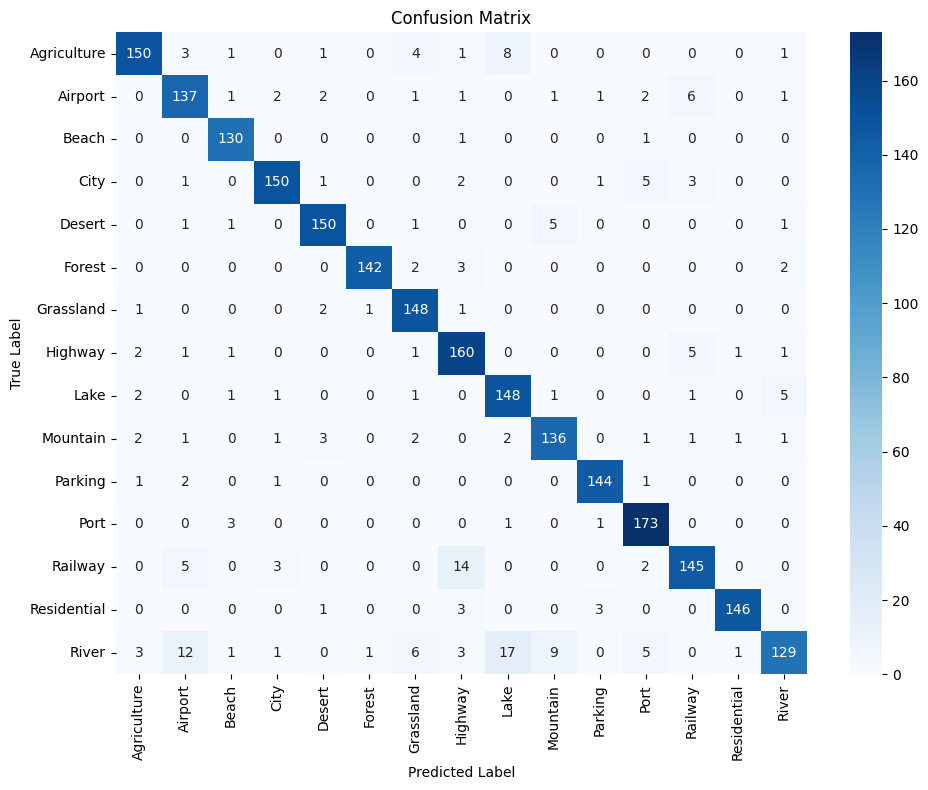

In [198]:
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

cm = confusion_matrix(all_labels, all_preds)

plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_labels, yticklabels=class_labels)

plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.tight_layout()
plt.show()

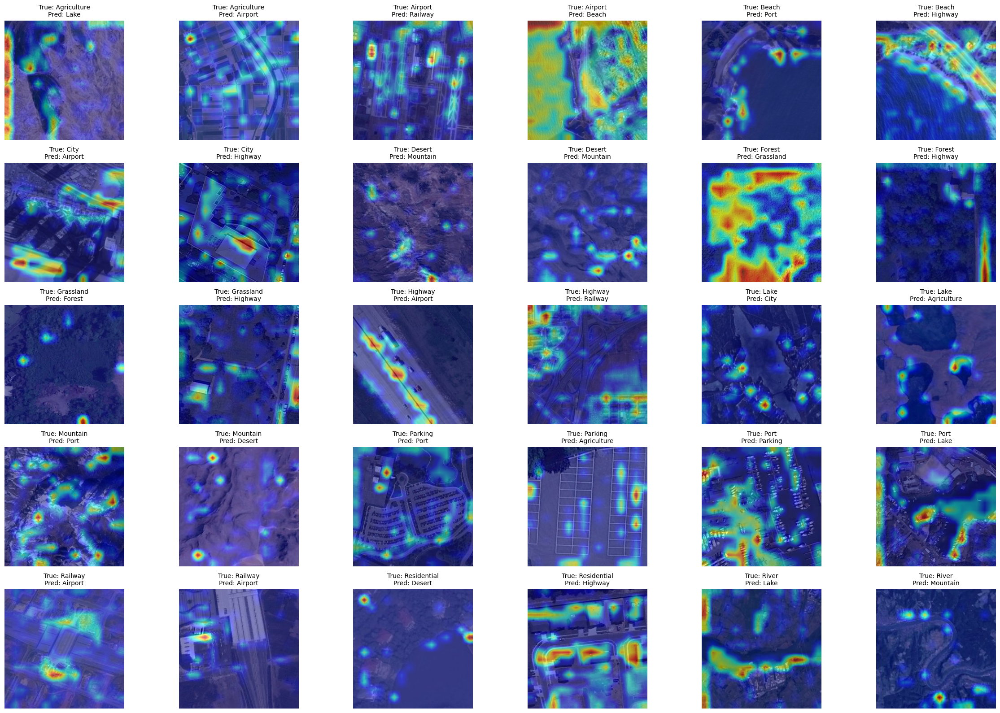

In [200]:
import random
import matplotlib.pyplot as plt
from torchvision.datasets import ImageFolder
from PIL import Image
import numpy as np
import torch
import os

idx_to_class = {v: k for k, v in val_dataset.subset.dataset.class_to_idx.items()}

wrong_samples_per_class = {}  # {true_label: [(img_path, true_label, pred_label), ...]}
model.eval()
with torch.no_grad():
    for i in val_dataset.subset.indices:
        img_path, true_label = val_dataset.subset.dataset.samples[i]
        image = Image.open(img_path).convert("RGB")
        input_tensor = val_transform(image).unsqueeze(0).to(device)
        output = model(input_tensor)
        pred = output.argmax(dim=1).item()
        if pred != true_label:
            if true_label not in wrong_samples_per_class:
                wrong_samples_per_class[true_label] = []
            if len(wrong_samples_per_class[true_label]) < 2:
                wrong_samples_per_class[true_label].append((img_path, true_label, pred))

wrong_samples = []
for v in sorted(wrong_samples_per_class.values(), key=lambda x: x[0][1]):
    wrong_samples.extend(v)
    if len(wrong_samples) >= 30:
        break

def display_wrong_gradcam_grid(wrong_samples, cam, val_transform, idx_to_class, device):
    fig, axes = plt.subplots(5, 6, figsize=(24, 16))
    axes = axes.flatten()

    for ax, (img_path, true_label, pred_label) in zip(axes, wrong_samples):
        image = Image.open(img_path).convert("RGB")
        image_np = np.array(image) / 255.0
        input_tensor = val_transform(image).unsqueeze(0).to(device)

        grayscale_cam = cam(input_tensor=input_tensor)[0]
        cam_result = show_cam_on_image(image_np, grayscale_cam, use_rgb=True)

        ax.imshow(cam_result)
        ax.set_title(f"True: {idx_to_class[true_label]}\nPred: {idx_to_class[pred_label]}", fontsize=10)
        ax.axis("off")

    plt.tight_layout()
    plt.show()

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
target_layer = model.features[-1]
cam = GradCAM(model=model, target_layers=[target_layer])

display_wrong_gradcam_grid(wrong_samples, cam, val_transform, idx_to_class, device)

**Agriculture → Railway**  
The attention map focuses on long strip-shaped farmland boundaries, which the model mistakenly recognizes as railway-like structures.  

**Airport → Lake**  
The runway is misclassified as a water surface, likely due to its clear edges and bluish textures.  

**Desert → Beach**  
The heatmap shows attention on bright sandy areas, indicating confusion due to color similarity.  

**Forest → Grassland**  
Attention is focused on large green textures, which are visually similar, making it hard for the model to distinguish.  

**Mountain → Highway**  
The model may have mistaken mountain ridges for roads due to similar edge textures.  

**Parking → Airport**  
The attention is on cement areas or markings; airports and parking lots do share similar textures.  

**Residential → City**  
Both are densely built areas; the model might rely on structure density and size to make decisions.  

**River → City**  
The heatmap focuses near water edges, possibly because rivers in urban areas led the model to predict “city”.

In [203]:
import cv2
import matplotlib.pyplot as plt
from albumentations.pytorch import ToTensorV2
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from PIL import Image
import numpy as np
import torch
import random
import pandas as pd
from IPython.display import display

def add_noise(img):
    noise = np.random.normal(0, 25, img.shape).astype(np.uint8)
    return np.clip(img + noise, 0, 255)

def add_blur(img):
    return cv2.GaussianBlur(img, (11, 11), 5)

def add_occlusion(img):
    h, w, _ = img.shape
    x, y = random.randint(0, w-60), random.randint(0, h-60)
    img[y:y+60, x:x+60] = 0
    return img

def visualize_robustness_per_class(model, val_dataset, val_transform, idx_to_class, device):
    model.eval()
    cam = GradCAM(model=model, target_layers=[model.features[-1]])

    class_used = set()
    shown = 0
    fig, axes = plt.subplots(15, 4, figsize=(16, 42))  # 每类一行，4图

    table_data = []

    for i in val_dataset.subset.indices:
        img_path, true_label = val_dataset.subset.dataset.samples[i]
        image = Image.open(img_path).convert("RGB")
        img_np = np.array(image)
        input_tensor = val_transform(image).unsqueeze(0).to(device)

        with torch.no_grad():
            pred = model(input_tensor).argmax(1).item()

        if pred == true_label and true_label not in class_used:
            row = {
                "Original": idx_to_class[pred]
            }

            cam_base = cam(input_tensor=input_tensor)[0]
            vis_base = show_cam_on_image(img_np/255.0, cam_base, use_rgb=True)
            axes[shown, 0].imshow(vis_base)
            axes[shown, 0].set_title(idx_to_class[pred])

            for j, (func, name) in enumerate(zip([add_noise, add_blur, add_occlusion], ["Noise", "Blur", "Occlusion"])):
                disturbed = func(img_np.copy())
                pil_dist = Image.fromarray(disturbed)
                input_dist = val_transform(pil_dist).unsqueeze(0).to(device)

                cam_dist = cam(input_tensor=input_dist)[0]
                vis = show_cam_on_image(disturbed / 255.0, cam_dist, use_rgb=True)

                with torch.no_grad():
                    pred_dist = model(input_dist).argmax(1).item()

                axes[shown, j+1].imshow(vis)
                axes[shown, j+1].set_title(idx_to_class[pred_dist])

                row[name] = idx_to_class[pred_dist]

            for k in range(4):
                axes[shown, k].axis('off')
            axes[shown, 0].set_ylabel(idx_to_class[true_label], fontsize=12)

            table_data.append(row)
            class_used.add(true_label)
            shown += 1
            if shown == 15:
                break

    plt.tight_layout()
    plt.show()

    return pd.DataFrame(table_data)

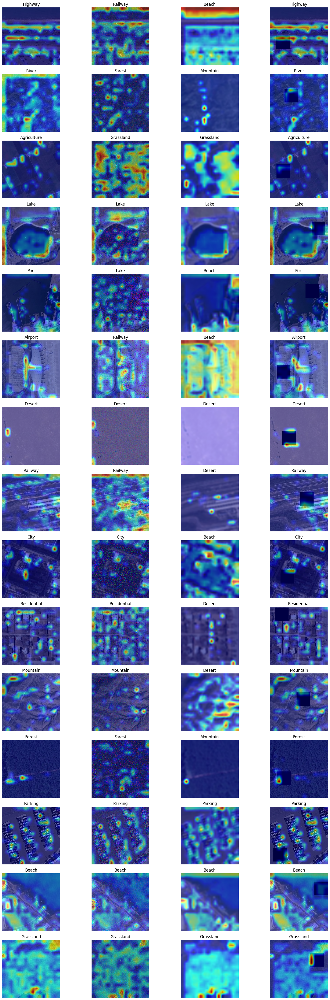

In [205]:
df = visualize_robustness_per_class(model, val_dataset, val_transform, idx_to_class, device)

In [207]:
from IPython.display import display
display(df)

,Original,Noise,Blur,Occlusion
0,Highway,Railway,Beach,Highway
1,River,Forest,Mountain,River
2,Agriculture,Grassland,Grassland,Agriculture
3,Lake,Lake,Lake,Lake
4,Port,Lake,Beach,Port
5,Airport,Railway,Beach,Airport
6,Desert,Desert,Desert,Desert
7,Railway,Railway,Desert,Railway
8,City,City,Beach,City
9,Residential,Residential,Desert,Residential


In [209]:
noise_changed = (df["Original"] != df["Noise"]).sum()
blur_changed = (df["Original"] != df["Blur"]).sum()
occl_changed = (df["Original"] != df["Occlusion"]).sum()

print(f"Noise     changed: {noise_changed}/15 ({100 * noise_changed/15:.1f}%)")
print(f"Blur      changed: {blur_changed}/15 ({100 * blur_changed/15:.1f}%)")
print(f"Occlusion changed: {occl_changed}/15 ({100 * occl_changed/15:.1f}%)")

Noise     changed: 5/15 (33.3%)
Blur      changed: 10/15 (66.7%)
Occlusion changed: 0/15 (0.0%)


In [235]:
from torch.utils.data import Dataset
import numpy as np
from PIL import Image
import cv2
import random

def add_noise(img):
    noise = np.random.normal(0, 25, img.shape).astype(np.uint8)
    return np.clip(img + noise, 0, 255)

def add_blur(img):
    return cv2.GaussianBlur(img, (11, 11), 5)

def add_occlusion(img):
    h, w, _ = img.shape
    x, y = random.randint(0, w-60), random.randint(0, h-60)
    img[y:y+60, x:x+60] = 0
    return img

class DisturbedValDataset(Dataset):
    def __init__(self, subset, transform, disturb_type="noise"):
        self.subset = subset
        self.transform = transform
        self.disturb_type = disturb_type.lower()
        self.disturb_func = {
            "noise": add_noise,
            "blur": add_blur,
            "occlusion": add_occlusion
        }[self.disturb_type]

    def __len__(self):
        return len(self.subset)

    def __getitem__(self, idx):
        img_path, label = self.subset.dataset.samples[self.subset.indices[idx]]
        img = np.array(Image.open(img_path).convert("RGB"))
        disturbed = self.disturb_func(img.copy())
        disturbed = Image.fromarray(disturbed)
        if self.transform:
            disturbed = self.transform(disturbed)
        return disturbed, label

In [237]:
val_dataset_noise = DisturbedValDataset(val_subset, val_transform, disturb_type="noise")
val_dataset_blur = DisturbedValDataset(val_subset, val_transform, disturb_type="blur")
val_dataset_occl = DisturbedValDataset(val_subset, val_transform, disturb_type="occlusion")

val_loader_noise = DataLoader(val_dataset_noise, batch_size=BATCH_SIZE, shuffle=False)
val_loader_blur = DataLoader(val_dataset_blur, batch_size=BATCH_SIZE, shuffle=False)
val_loader_occl = DataLoader(val_dataset_occl, batch_size=BATCH_SIZE, shuffle=False)

In [246]:
from sklearn.metrics import classification_report, accuracy_score

def evaluate_on_loader(model, loader, class_names, device, verbose=True):
    model.eval()
    all_preds, all_labels = [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            preds = outputs.argmax(1)
            all_preds.extend(preds.cpu().tolist())
            all_labels.extend(labels.cpu().tolist())
    acc = accuracy_score(all_labels, all_preds)
    if verbose:
        print(classification_report(all_labels, all_preds, target_names=class_names, digits=4))
    return acc

In [253]:
class_names = [idx_to_class[i] for i in range(len(idx_to_class))]

print("\n=== Noise Validation Accuracy ===")
evaluate_on_loader(model, val_loader_noise, class_names, device)

print("\n=== Blur Validation Accuracy ===")
evaluate_on_loader(model, val_loader_blur, class_names, device)

print("\n=== Occlusion Validation Accuracy ===")
evaluate_on_loader(model, val_loader_occl, class_names, device)


=== Noise Validation Accuracy ===
              precision    recall  f1-score   support

 Agriculture     0.7118    0.7160    0.7139       169
     Airport     0.7851    0.6129    0.6884       155
       Beach     0.7633    0.9773    0.8571       132
        City     0.6313    0.8405    0.7211       163
      Desert     0.6438    0.8868    0.7460       159
      Forest     0.6341    0.8725    0.7345       149
   Grassland     0.7927    0.8497    0.8202       153
     Highway     0.8976    0.6628    0.7625       172
        Lake     0.4047    0.5437    0.4640       160
    Mountain     0.7982    0.6026    0.6868       151
     Parking     0.8750    0.8456    0.8601       149
        Port     0.6119    0.6910    0.6491       178
     Railway     0.6976    0.8462    0.7647       169
 Residential     0.9765    0.5425    0.6975       153
       River     0.9318    0.2181    0.3534       188

    accuracy                         0.7046      2400
   macro avg     0.7437    0.7139    0.7013  

0.89875

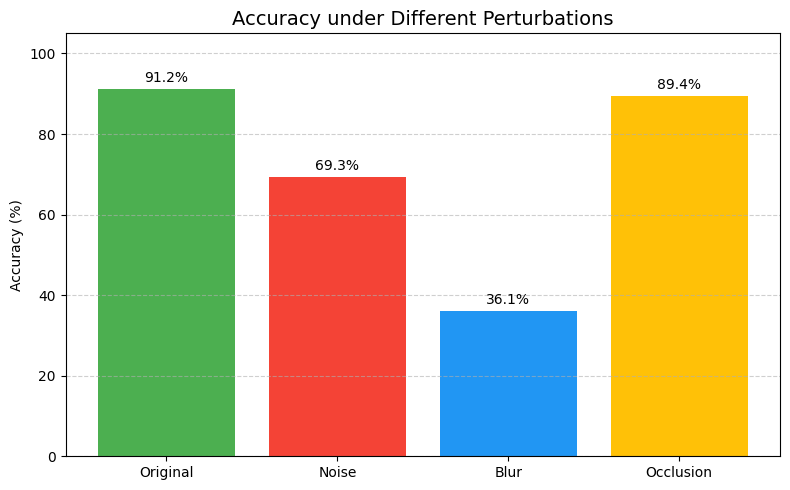

In [255]:
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt

acc_original = accuracy_score(all_labels, all_preds)
acc_noise = evaluate_on_loader(model, val_loader_noise, class_names, device, verbose=False)
acc_blur  = evaluate_on_loader(model, val_loader_blur, class_names, device, verbose=False)
acc_occl  = evaluate_on_loader(model, val_loader_occl, class_names, device, verbose=False)

methods = ["Original", "Noise", "Blur", "Occlusion"]
accuracies = [acc_original, acc_noise, acc_blur, acc_occl]

plt.figure(figsize=(8, 5))
bars = plt.bar(methods, [a * 100 for a in accuracies], color=["#4CAF50", "#F44336", "#2196F3", "#FFC107"])

for bar, acc in zip(bars, accuracies):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1, f"{acc*100:.1f}%", ha='center', va='bottom')

plt.ylim(0, 105)
plt.title("Accuracy under Different Perturbations", fontsize=14)
plt.ylabel("Accuracy (%)")
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()
